Author : **Hajer SOUAIFI-AMARA**

Creation date : 04-MAR-2023

Final date : 18-MAR-2023

Modification date : 17-MAR-2023 - reintroducing ART + IG blood cells from Barcelona dataset and recategorizing images using their labels (IG : IG, MY: MY, MMY and PMY: PMY) and using a single class IG for 'IG', 'MY', 'MMY', 'PMY' 

## Transfer learning and Fine tuning
https://www.tensorflow.org/tutorials/images/transfer_learning?hl=fr

### VGG16 + Fine tuning
Les cellules sanguines font partie des catégories d'images médicales incluses dans le jeu de données ImageNet.

Plus précisément, il existe plusieurs catégories d'images de cellules sanguines dans ImageNet, notamment :

- Red blood cell (globule rouge)
- White blood cell (globule blanc)
- Platelet (plaquette sanguine)

Mais il faut noté que VGG16 n'a pas été spécifiquement entraîné pour la détection ou la segmentation de cellules sanguines, et il est possible qu'il ne soit pas très précis pour cette tâche particulière.

In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

In [2]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix

import itertools
import sys, os
from pathlib import Path
import glob
import time
from timeit import default_timer as timer

from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import LabelEncoder

import PIL
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Activation, Input, Dropout, Flatten, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.utils import plot_model
from keras.utils import to_categorical
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import Callback

from tensorflow.keras.applications.vgg16 import VGG16

# Appel les fonctions "Utils"
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/Crosstables_HSA.py
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/Classif_report_HSA.py
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/GradCAM_HSA.py    
    
print(tf.__version__)

2.10.0


In [3]:
#import time
#import cv2
#from google.colab.patches import cv2_imshow

In [4]:
# GPU status verification
import tensorflow as tf 
if tf.test.gpu_device_name(): 
    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))
else:
    print("Please change your hardware accelerator")

Default GPU Device:/device:GPU:0


In [5]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
print(f'Tensorflow: {tf.__version__}')
gpu_count = sum(1 for dev in tf.config.experimental.list_physical_devices()
                    if dev.device_type == 'GPU')
print(f'Number of GPUs: {gpu_count}')

Tensorflow: 2.10.0
Number of GPUs: 1


In [6]:
root_path = 'C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification'

#root_path = '/content/drive/MyDrive/Projet_DS_DataScientest_BCC'
data_path = f'{root_path}/2-Data'

In [7]:
train_data = pd.read_csv(f'{data_path}/BCC_train_dataset_10cat.csv')
validation_data = pd.read_csv(f'{data_path}/BCC_val_dataset_10cat.csv')
test_data = pd.read_csv(f'{data_path}/BCC_test_dataset_10cat.csv')

### Chargement des images à l'aide de ImageDataGenerator:

In [8]:
batch_size = 32
height  = 256
width = 256

train_generator = ImageDataGenerator(
                    preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

valid_generator = ImageDataGenerator(
                   preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

test_generator = ImageDataGenerator(
                   preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

training_set = train_generator.flow_from_dataframe(train_data, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'image_path', 
                                                   y_col = 'blood_cell',
                                                   target_size = (height, width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'sparse', 
                                                   batch_size = batch_size,
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(validation_data, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'image_path', 
                                                     y_col = 'blood_cell',
                                                     target_size = (height, width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'sparse', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(test_data, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'image_path', 
                                                 y_col = 'blood_cell',
                                                 target_size = (height, width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'sparse', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index definition :
label_map = training_set.class_indices
print(label_map)

Found 43273 validated image filenames belonging to 10 classes.
Found 10819 validated image filenames belonging to 10 classes.
Found 13524 validated image filenames belonging to 10 classes.
{'ART': 0, 'BAS': 1, 'EOS': 2, 'ERY': 3, 'IG': 4, 'LYM': 5, 'MON': 6, 'MYB': 7, 'NEU': 8, 'PLT': 9}


### Définition des callbacks

In [9]:
%load_ext tensorboard
log_dir = f'{root_path}/6-Final_code/04-MODELISATION/VGG16/'
tensorboard = callbacks.TensorBoard(log_dir = log_dir)

class TimingCallback(Callback):
    def __init__(self, logs={}):
        self.logs=[]
    def on_epoch_begin(self, epoch, logs={}):
        self.starttime = timer()
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(timer()-self.starttime)
        
filepath = f'{root_path}/4-Notebooks/HSA/V06/model.h5'

TON = callbacks.TerminateOnNaN()

backup = tf.keras.callbacks.BackupAndRestore(backup_dir="f'{root_path}/4-Notebooks/HSA/tmp/backup")

save_model_callback = ModelCheckpoint(filepath=filepath, 
                                      verbose=2,
                                      save_best_only=True,
                                      save_weights_only=False,
                                      mode='max',
                                      #save_freq=1,
                                      monitor='val_acc')

early_stopping = EarlyStopping(patience=5, # Attendre 5 epochs avant application
                                min_delta = 0.01, # si au bout de 5 epochs la fonction de perte ne varie pas de 1%, 
                                                  # que ce soit à la hausse ou à la baisse, on arrête
                                verbose=1, # Afficher à quel epoch on s'arrête
                                mode = 'min',
                                restore_best_weights = True,
                                monitor='val_loss')

reduce_learning_rate = ReduceLROnPlateau(monitor="val_loss",
                                    patience=3, #si val_loss stagne sur 3 epochs consécutives selon la valeur min_delta
                                    min_delta= 0.01,
                                    factor=0.1,  # On réduit le learning rate d'un facteur 0.1
                                    cooldown = 4, # On attend 4 epochs avant de réitérer 
                                    verbose=1)

time_callback = TimingCallback()

### Définition du préprocessing et de l'augmentation des données

In [10]:
height = 256
width = 256
height_crop = 180
width_crop = 180

##### 1. Preprocessing layer

In [11]:
data_preprocessing = tf.keras.Sequential(
    [
        layers.Resizing(height=height, width=width, interpolation='nearest',crop_to_aspect_ratio=False), # redimensionne un lot d'images à une taille cible.
        layers.CenterCrop(height=height_crop, width = width_crop), #retourne une culture centrale d'un lot d'images
        layers.Rescaling(scale=1./255), # remet à l' échelle et les décalages des valeurs d'un lot d'images 
    ]
)


##### 2. Data augmentation layer

In [12]:
data_augmentation = tf.keras.Sequential(
    [
        layers.RandomFlip("horizontal", seed=42),
        layers.RandomFlip("vertical", seed=42),
        layers.RandomRotation(0.2,interpolation='nearest', seed=42),
        layers.RandomHeight(0.1, interpolation='nearest', seed=42),
        layers.RandomWidth(0.1, interpolation='nearest', seed=42),
    ]
)

### Modèle VGG16

In [13]:
# Modèle VGG16
#height_crop  = 180
#width_crop = 180
#input = Input(shape=(height_crop, width_crop, 3))
#base_model = VGG16(weights='imagenet', include_top=False, input_tensor=input) 
# Freezer les couches du VGG16
#for layer in base_model.layers: 
#    layer.trainable = False
#base_model.summary()

In [14]:
num_cat=10
height_crop  = 180
width_crop = 180
# Model (Functional API)
inputs = layers.Input(shape = (height,width,3))
x = data_preprocessing(inputs)
x = data_augmentation(x)
base_model = VGG16(include_top = False,
                      weights = "imagenet",
                      input_tensor = inputs,
                      input_shape = (height_crop,width_crop,3))
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(num_cat, activation='softmax')(x)
VGG16_model = tf.keras.Model(inputs, outputs)

for layer in base_model.layers: 
    layer.trainable = False
base_model.trainable = False

In [15]:
#num_cat=10
#height_crop  = 180
#width_crop = 180

#inputs = layers.Input(shape=(height, width, 3))
#x = data_preprocessing(inputs)
#x = data_augmentation(x)

#x = base_model(x)

#x = layers.GlobalAveragePooling2D()(x)
#x = layers.Dense(1024, activation='relu')(x)
#x = layers.Dropout(0.2)(x)
#x = layers.Dense(256, activation='relu')(x)
#outputs = layers.Dense(num_cat, activation='softmax')(x)

#VGG16_model = tf.keras.Model(inputs=inputs, outputs=outputs)

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
VGG16_model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

VGG16_model.summary(expand_nested=True)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

### Calcul de la pondération

In [16]:
# Calculate the weights for each class so that we can balance the data
le = LabelEncoder()
train_labels_encoded = le.fit_transform(train_data['blood_cell'])

#Pondération par équilibrage des classes
class_weights = compute_class_weight(class_weight='balanced', 
                                      classes=np.unique(train_labels_encoded), 
                                      y=train_labels_encoded)

# ou par Fréquences inverses:
# Calcul des fréquences inverses des classes
#n_samples = train_data['blood_cell'].shape[0]
#class_counts = np.bincount(train_data['blood_cell'])
#inverse_weights = {i: n_samples / float(class_counts[i]) for i in range(len(class_counts))}

class_weight_dict = dict(enumerate(class_weights))
print(class_weight_dict)

{0: 2.247948051948052, 1: 4.125166825548141, 2: 1.4357332448573326, 3: 3.1379985496736764, 4: 1.7070216962524656, 5: 0.5305664541441883, 6: 1.2495812879006643, 7: 1.027618142958917, 8: 0.27076085596295835, 9: 2.775689544579859}


In [17]:
nb_img_train = training_set.samples
print(nb_img_train)
nb_img_val = validation_set.samples
print(nb_img_val)

43273
10819


In [18]:
batch_size = 32
training_history_VGG16 = VGG16_model.fit(
                                  training_set,
                                  epochs=10,
                                  steps_per_epoch = nb_img_train//batch_size,
                                  validation_data=validation_set,
                                  validation_steps = nb_img_val//batch_size,
                                  class_weight=class_weight_dict,
                                  callbacks = [TON, reduce_learning_rate, early_stopping, tensorboard]
                                  )

Epoch 1/10
1352/1352 [==============================] - 2220s 2s/step - loss: 1.0161 - accuracy: 0.6622 - val_loss: 0.7594 - val_accuracy: 0.7340 - lr: 0.0010
Epoch 2/10
1352/1352 [==============================] - 2253s 2s/step - loss: 0.6847 - accuracy: 0.7624 - val_loss: 0.5363 - val_accuracy: 0.8223 - lr: 0.0010
Epoch 3/10
1352/1352 [==============================] - 2259s 2s/step - loss: 0.6151 - accuracy: 0.7856 - val_loss: 0.6066 - val_accuracy: 0.7900 - lr: 0.0010
Epoch 4/10
1352/1352 [==============================] - 2251s 2s/step - loss: 0.5667 - accuracy: 0.7981 - val_loss: 0.6009 - val_accuracy: 0.7869 - lr: 0.0010
Epoch 5/10
1352/1352 [==============================] - 2257s 2s/step - loss: 0.5420 - accuracy: 0.8093 - val_loss: 0.5207 - val_accuracy: 0.8235 - lr: 0.0010
Epoch 6/10
1352/1352 [==============================] - 2232s 2s/step - loss: 0.5134 - accuracy: 0.8155 - val_loss: 0.5470 - val_accuracy: 0.8152 - lr: 0.0010
Epoch 7/10
1352/1352 [========================

In [19]:
VGG16_model.save('./VGG16_model_18MAR23-1.hdf5')
VGG16_model.save('./VGG16_model_18MAR23-1.h5')
VGG16_model.save_weights('./VGG16_model_weights_18MAR23-1.hdf5')
VGG16_model.save_weights('./VGG16_model_weights_18MAR23-1.h5')

In [20]:
train_acc_VGG16 = training_history_VGG16.history['accuracy']
val_acc_VGG16 = training_history_VGG16.history['val_accuracy']
train_loss_VGG16 = training_history_VGG16.history['loss']
val_loss_VGG16 = training_history_VGG16.history['val_loss']

In [21]:
# Sauvegarde des objets History :
acc_VGG16 = pd.concat([pd.DataFrame(train_acc_VGG16), pd.DataFrame(val_acc_VGG16)], axis = 1)
acc_VGG16.reset_index(inplace = True)
acc_VGG16.to_csv('./acc_VGG16_18MAR23-1.csv', index=True)

loss_VGG16 = pd.concat([pd.DataFrame(train_loss_VGG16),pd.DataFrame(val_loss_VGG16)], axis = 1)
loss_VGG16.reset_index(inplace = True)
loss_VGG16.to_csv('./loss_VGG16_18MAR23-1.csv',index=True)

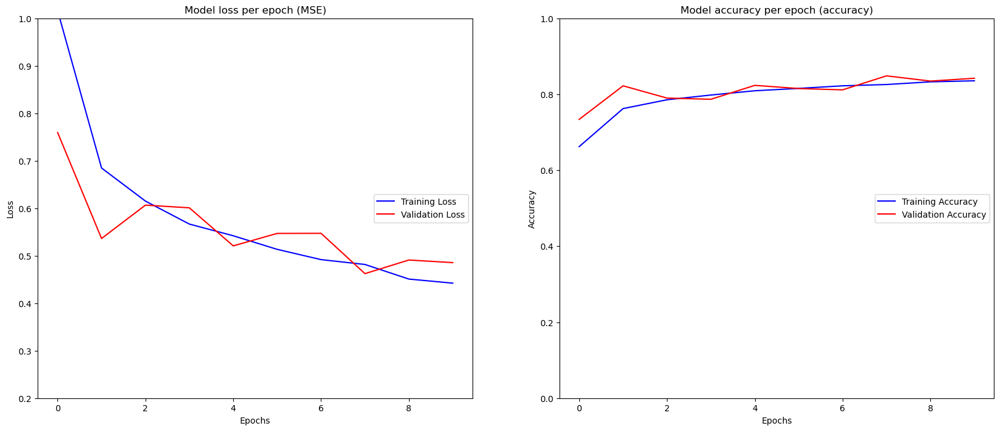

In [22]:
plt.figure(figsize = (20, 8))

plt.subplot(121)
plt.plot(train_loss_VGG16, label = 'Training Loss', color = 'blue')
plt.plot(val_loss_VGG16, label = 'Validation Loss', color = 'red')
plt.ylim([0.2, 1.0])
plt.title('Model loss per epoch (MSE)')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(loc='right')

plt.subplot(122)
plt.plot(train_acc_VGG16, label = 'Training Accuracy', color = 'blue')
plt.plot(val_acc_VGG16, label = 'Validation Accuracy', color = 'red')
plt.ylim([0, 1.0])
plt.title('Model accuracy per epoch (accuracy)')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(loc='right')

plt.show();

### Confusion matrix  du modèle VGG16

423/423 [==============================] - 548s 1s/step


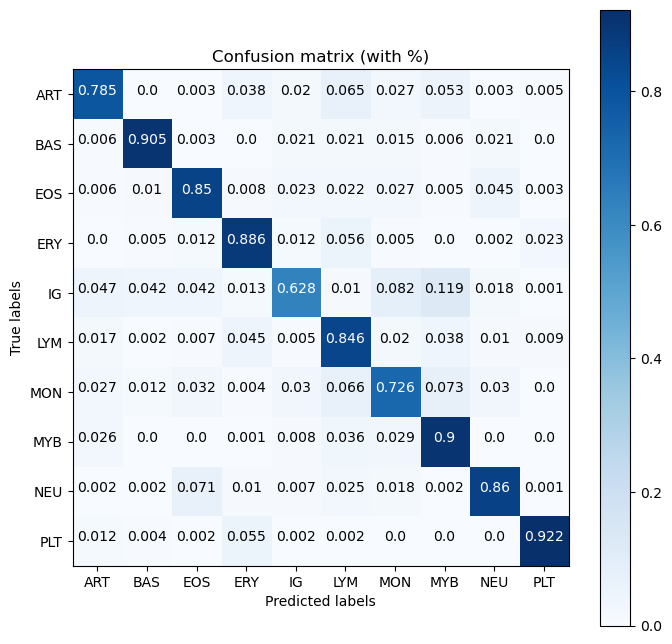

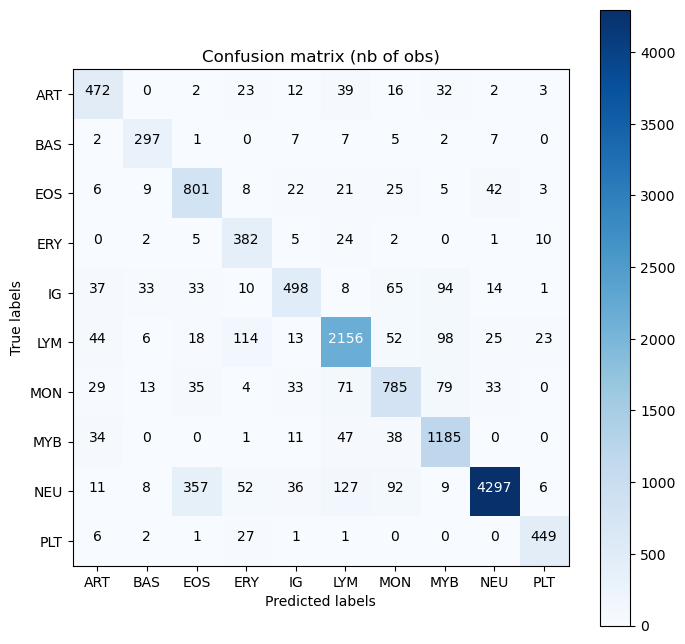

Classification Report


,precision,recall,f1-score,support
ART,0.736349,0.785358,0.760064,601.000000
BAS,0.802703,0.905488,0.851003,328.000000
EOS,0.639266,0.850318,0.729841,942.000000
ERY,0.615137,0.886311,0.726236,431.000000
IG,0.780564,0.627995,0.696017,793.000000
LYM,0.862055,0.845822,0.853861,2549.000000
MON,0.726852,0.725508,0.726179,1082.000000
MYB,0.787899,0.900456,0.840426,1316.000000
NEU,0.971952,0.860260,0.912702,4995.000000
PLT,0.907071,0.921971,0.914460,487.000000


In [23]:
## Bilan sur les données de test :
print_classification_report(testing_set, VGG16_model, label_map)

In [24]:
VGG16_model.evaluate(testing_set)

423/423 [==============================] - 545s 1s/step - loss: 0.5080 - accuracy: 0.8372


[0.508028507232666, 0.8371782898902893]

In [ ]:
#Pour charger le modèle sauvé
#saved_model = tf.keras.models.load_model('./mobilnetV2_modelv1')

In [25]:
%run C:/Users/amara/Documents/Formation_DS_DataScientest/Projet_DS_DataScientest_BCC/Blood_Cells_Classification/6-Final_code/00-UTILS/GradCAM_HSA.py

<Figure size 640x480 with 0 Axes>

In [26]:
predictions = VGG16_model.predict(testing_set)
y_pred = tf.argmax(predictions, axis = 1)
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":test_data["image_path"]})

df_results["good_class"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

423/423 [==============================] - 543s 1s/step


1/1 [==============================] - 0s 16ms/step


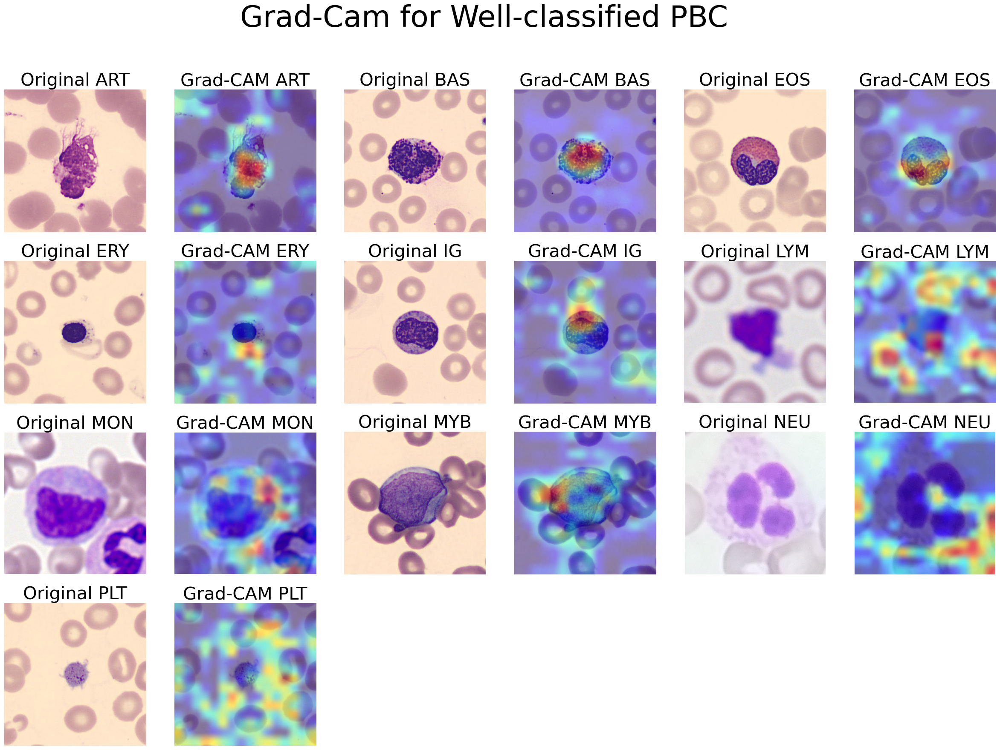

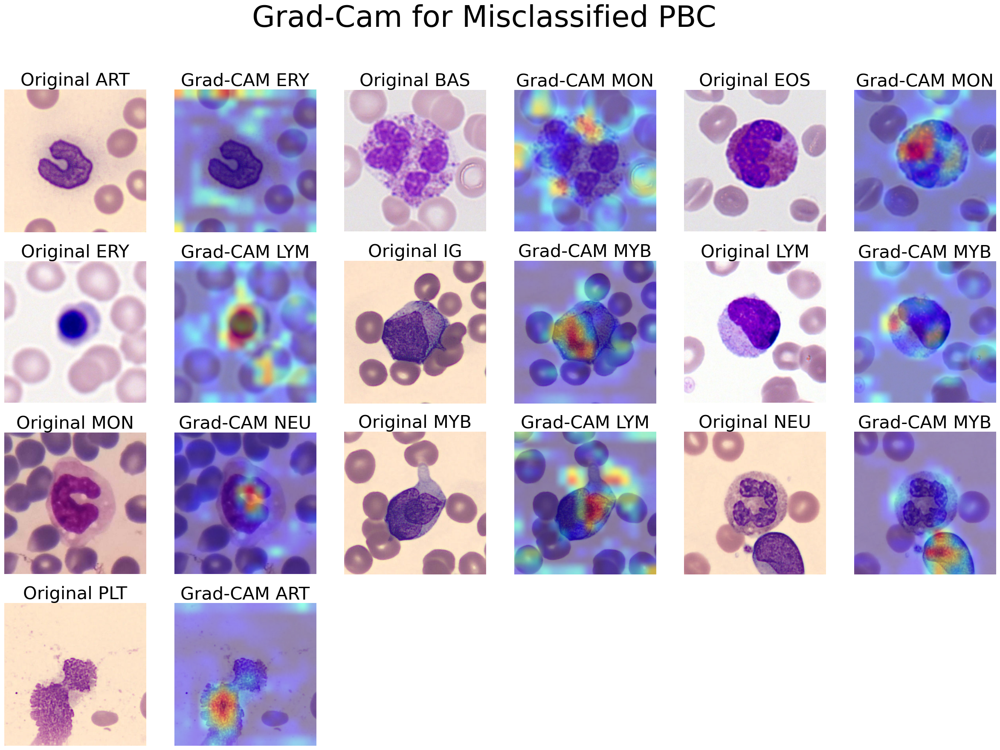

In [27]:
grad_cam_viz(df_results, VGG16_model, 'vgg16', 10, height, width, height_crop, width_crop, label_map)

## Phase de Fine tuning

In [ ]:
#VGG16_model = load_model('./VGG16_model_17MAR23-1.hdf5')

In [ ]:
# Model (Functional API)
inputs = layers.Input(shape = (height,width,3))
x = data_preprocessing(inputs)
x = data_augmentation(x)
base_model = VGG16(include_top = False,
                      weights = "imagenet",
                      input_tensor = inputs,
                      input_shape = (height,width,3))
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(256, activation='relu')(x)
outputs = layers.Dense(num_cat, activation='softmax')(x)
VGG16_model = tf.keras.Model(inputs, outputs)

base_model.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable= True

In [28]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  19


In [29]:
# De-friser les 4 dernières couches de convolution (block 5) du VGG16
for layer in base_model.layers[-4:]:
    layer.trainable= True

In [30]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
VGG16_model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

VGG16_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [31]:
len(VGG16_model.trainable_variables)

12

In [32]:
print(training_history_VGG16.epoch[-1])

9


In [33]:
for layer_number, layer in enumerate(base_model.layers):
  print(layer_number, layer.name, layer.trainable)

0 input_1 False
1 block1_conv1 False
2 block1_conv2 False
3 block1_pool False
4 block2_conv1 False
5 block2_conv2 False
6 block2_pool False
7 block3_conv1 False
8 block3_conv2 False
9 block3_conv3 False
10 block3_pool False
11 block4_conv1 False
12 block4_conv2 False
13 block4_conv3 False
14 block4_pool False
15 block5_conv1 True
16 block5_conv2 True
17 block5_conv3 True
18 block5_pool True


In [34]:
batch_size = 32
initial_epochs = 9
fine_tune_epochs = initial_epochs + 10

training_history_VGG16_FT = VGG16_model.fit(
                                  training_set,
                                  epochs=fine_tune_epochs,
                                  initial_epoch=training_history_VGG16.epoch[-1], # start from previous last epoch
                                  steps_per_epoch = nb_img_train//batch_size,
                                  validation_data=validation_set,
                                  validation_steps = nb_img_val//batch_size,
                                  class_weight=class_weight_dict,
                                  callbacks = [TON, reduce_learning_rate, early_stopping, tensorboard]
                                  #, early_stopping,
                                  #use_multiprocessing = True
                                  )

Epoch 10/19
1352/1352 [==============================] - 2709s 2s/step - loss: 0.3241 - accuracy: 0.8859 - val_loss: 0.3373 - val_accuracy: 0.8933 - lr: 1.0000e-05
Epoch 11/19
1352/1352 [==============================] - 2692s 2s/step - loss: 0.2297 - accuracy: 0.9203 - val_loss: 0.3136 - val_accuracy: 0.8959 - lr: 1.0000e-05
Epoch 12/19
1352/1352 [==============================] - 2710s 2s/step - loss: 0.1796 - accuracy: 0.9354 - val_loss: 0.3319 - val_accuracy: 0.9007 - lr: 1.0000e-05
Epoch 13/19
1352/1352 [==============================] - 2909s 2s/step - loss: 0.1487 - accuracy: 0.9456 - val_loss: 0.2871 - val_accuracy: 0.9135 - lr: 1.0000e-05
Epoch 14/19
1352/1352 [==============================] - 2930s 2s/step - loss: 0.1184 - accuracy: 0.9558 - val_loss: 0.2897 - val_accuracy: 0.9140 - lr: 1.0000e-05
Epoch 15/19
1352/1352 [==============================] - 2904s 2s/step - loss: 0.0971 - accuracy: 0.9637 - val_loss: 0.2672 - val_accuracy: 0.9236 - lr: 1.0000e-05
Epoch 16/19
1352

In [35]:
VGG16_model.save('./VGG16_model_18MAR23-1_FT.hdf5')
VGG16_model.save('./VGG16_model_18MAR23-1_FT.h5')
VGG16_model.save_weights('./VGG16_model_weights_18MAR23-1_FT.hdf5')
VGG16_model.save_weights('./VGG16_model_weights_18MAR23-1_FT.h5')

In [36]:
train_acc_VGG16 += training_history_VGG16_FT.history['accuracy']
val_acc_VGG16 += training_history_VGG16_FT.history['val_accuracy']
train_loss_VGG16 += training_history_VGG16_FT.history['loss']
val_loss_VGG16 += training_history_VGG16_FT.history['val_loss']

In [37]:
# Sauvegarde des objets History :
acc_VGG16 = pd.concat([pd.DataFrame(train_acc_VGG16), pd.DataFrame(val_acc_VGG16)], axis = 1)
acc_VGG16.reset_index(inplace = True)
acc_VGG16.to_csv('./acc_VGG16_18MAR23-1_FT.csv', index=True)

loss_VGG16 = pd.concat([pd.DataFrame(train_loss_VGG16),pd.DataFrame(val_loss_VGG16)], axis = 1)
loss_VGG16.reset_index(inplace = True)
loss_VGG16.to_csv('./loss_VGG16_18MAR23-1_FT.csv',index=True)

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm
acc_VGG16 = pd.read_csv('./acc_VGG16_18MAR23-1_FT.csv')
loss_VGG16 = pd.read_csv('./loss_VGG16_18MAR23-1_FT.csv')

In [2]:
train_acc_VGG16 = acc_VGG16['0']
val_acc_VGG16 = acc_VGG16['0.1']
train_loss_VGG16 = loss_VGG16['0']
val_loss_VGG16 = loss_VGG16['0.1']

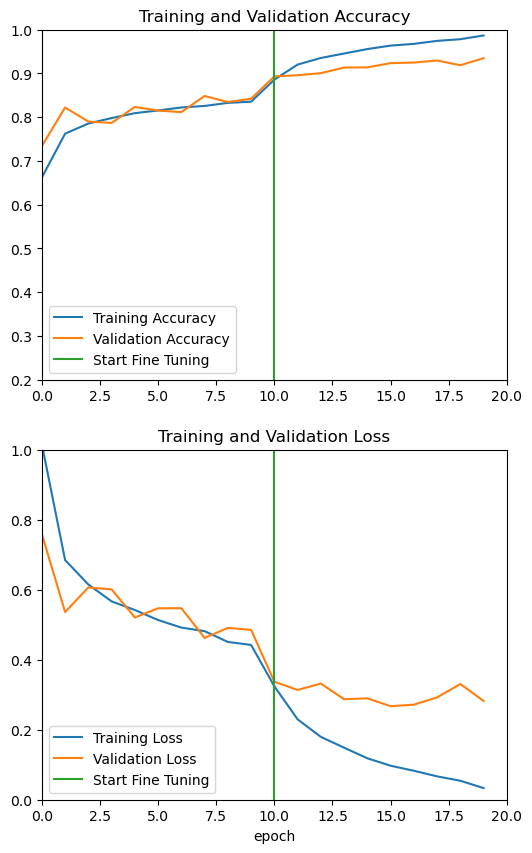

In [4]:
initial_epochs = 11
plt.figure(figsize=(6, 10))
plt.subplot(2, 1, 1)
plt.plot(train_acc_VGG16, label='Training Accuracy')
plt.plot(val_acc_VGG16, label='Validation Accuracy')
plt.xlim([0, 20])
plt.ylim([0.2, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(train_loss_VGG16, label='Training Loss')
plt.plot(val_loss_VGG16, label='Validation Loss')
plt.xlim([0, 20])
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower left')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [39]:
loss, accuracy = VGG16_model.evaluate(testing_set)
print('Test accuracy :', accuracy)

423/423 [==============================] - 713s 2s/step - loss: 0.3154 - accuracy: 0.9286
Test accuracy : 0.9286453127861023


423/423 [==============================] - 683s 2s/step


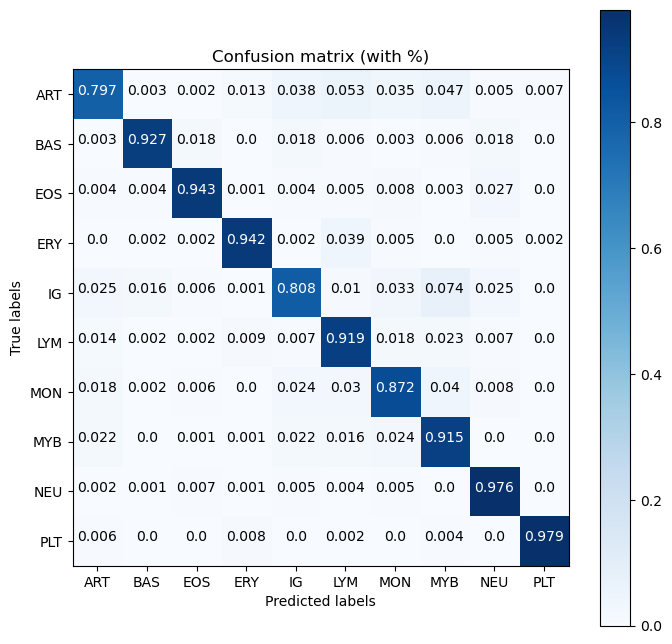

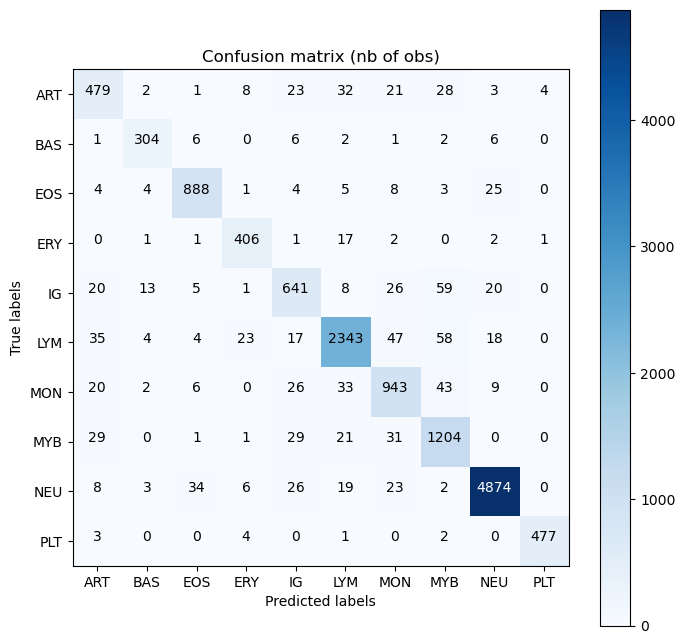

Classification Report


,precision,recall,f1-score,support
ART,0.799666,0.797005,0.798333,601.000000
BAS,0.912913,0.926829,0.919818,328.000000
EOS,0.938689,0.942675,0.940678,942.000000
ERY,0.902222,0.941995,0.921680,431.000000
IG,0.829237,0.808323,0.818646,793.000000
LYM,0.944377,0.919184,0.931610,2549.000000
MON,0.855717,0.871534,0.863553,1082.000000
MYB,0.859386,0.914894,0.886272,1316.000000
NEU,0.983256,0.975776,0.979502,4995.000000
PLT,0.989627,0.979466,0.984520,487.000000


In [40]:
## Bilan sur les données de test :
print_classification_report(testing_set, VGG16_model, label_map)

In [41]:
predictions = VGG16_model.predict(testing_set)
y_pred = tf.argmax(predictions, axis = 1)
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":test_data["image_path"]})

df_results["good_class"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

423/423 [==============================] - 571s 1s/step


In [42]:
df_results

,label,label_pred,img_path,good_class
0,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
1,4,4,C:/Users/amara/Documents/Formation_DS_DataScie...,True
2,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
3,0,0,C:/Users/amara/Documents/Formation_DS_DataScie...,True
4,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
...,...,...,...,...
13519,7,7,C:/Users/amara/Documents/Formation_DS_DataScie...,True
13520,8,8,C:/Users/amara/Documents/Formation_DS_DataScie...,True
13521,7,0,C:/Users/amara/Documents/Formation_DS_DataScie...,False
13522,7,7,C:/Users/amara/Documents/Formation_DS_DataScie...,True


In [43]:
df_results.to_csv(f'{data_path}/Pred_VGG16_18MAR23-1_FT.csv', index=False)

### Interprétabilité: Grad-CAM algorithm

1/1 [==============================] - 0s 15ms/step


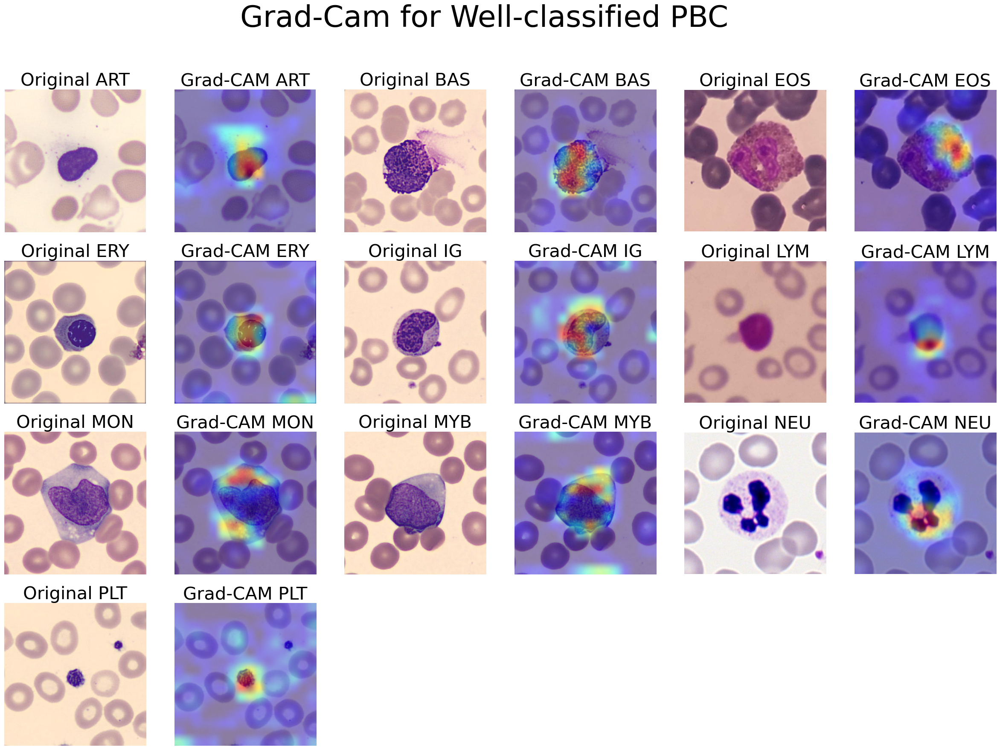

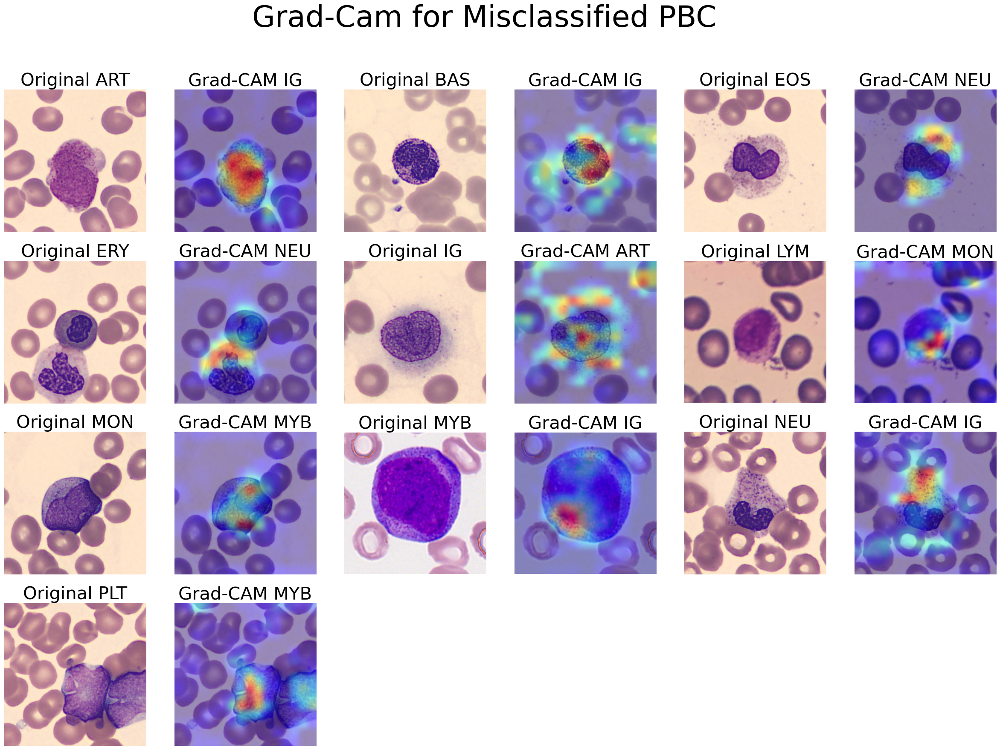

In [45]:
grad_cam_viz(df_results, VGG16_model, 'vgg16', 10, height, width, height_crop, width_crop, label_map)